Restauration des images
========

TP1 séance 2-3
========
--------
nom1

nom2

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
%matplotlib inline 

v=1
t=20
o=np.pi/4
var=10

 1) Développer un code qui permet d'appliquer un flou de bougé de l'image "lena.png" en fonction de la vitesse du bougé, de sa durée et de son orientation.

In [2]:
def spectre(img):
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    return fshift


def plot_spectre(img,title):
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20*np.log(np.abs(fshift+1e-8))
    plot(magnitude_spectrum,title)

def plot (img,title):
    plt.figure(1,figsize=(10,10))
    plt.subplot(111), plt.imshow(np.abs(img), cmap = 'gray')
    plt.title(title + str(img.shape)) 
    plt.show()

In [3]:
def H (img,v,t,o):
    fft_img=np.fft.fft2(img)
    fft_img=np.fft.fftshift(fft_img)
    X = np.arange(-img.shape[0]/2, img.shape[0]/2,1)/img.shape[0] #Normalisation
    Y = np.arange(-img.shape[1]/2, img.shape[1]/2,1)/img.shape[1] #Normalisation
    [x,y] = np.meshgrid(X,Y)
    return np.sinc(v*t*(x*np.cos(o)+y*np.sin(o)))


    

In [4]:


def flou_bouge(img,v,t,o):
    fft_img=np.fft.fft2(img)
    fft_img=np.fft.fftshift(fft_img)
    fft_flou=H(img,v,t,o)
    fft_img_flou=fft_flou*fft_img
    return fft_img_flou

def img_flou_bouge(img,v,t,o):
    fft_img_flou=flou_bouge(img,v,t,o)
    img_flou=np.fft.ifft2(fft_img_flou)
    return np.abs(img_flou)
    
def spectre_flou_bouge(img,v,t,o):
    fft_img_flou=flou_bouge(img,v,t,o)
    fft_img_flou_db = 20*np.log(np.abs(fft_img_flou)+ 1e-8)
    return fft_img_flou_db

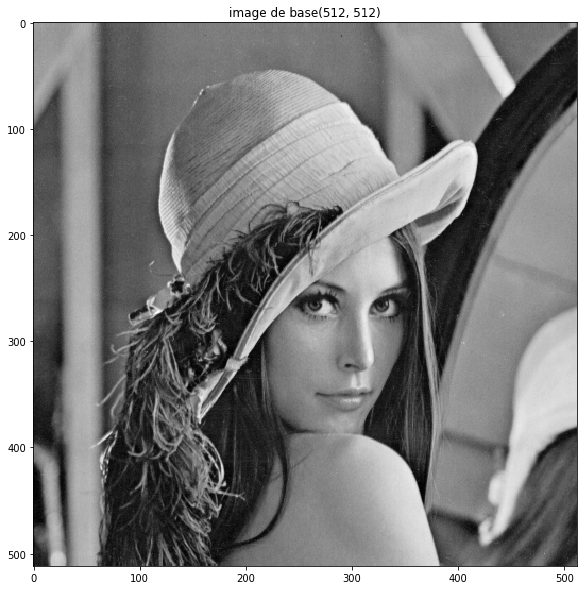

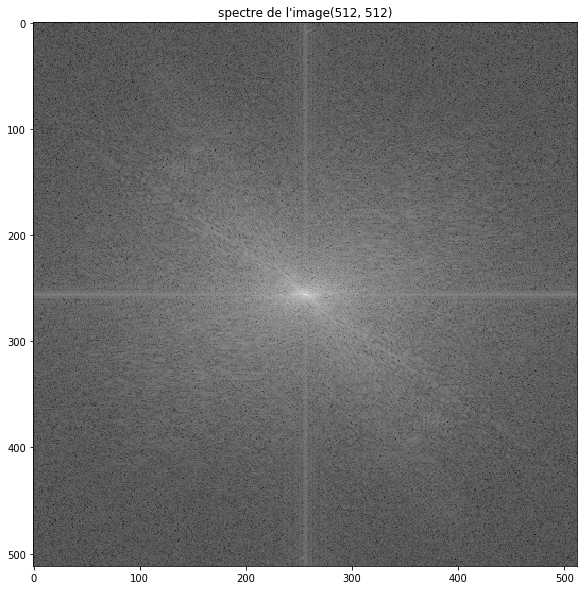

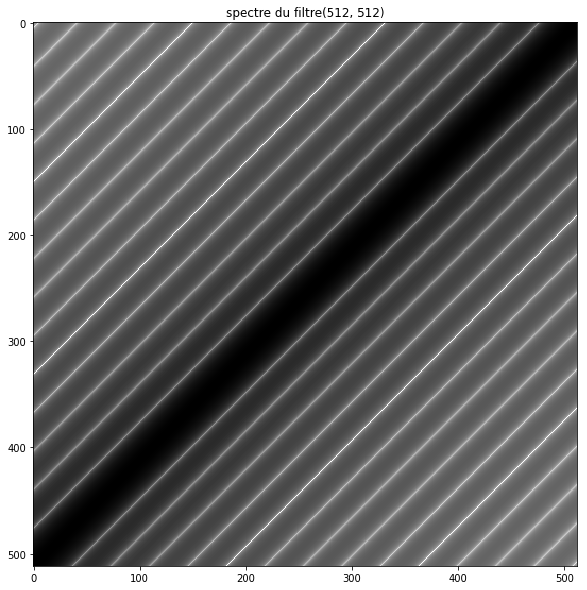

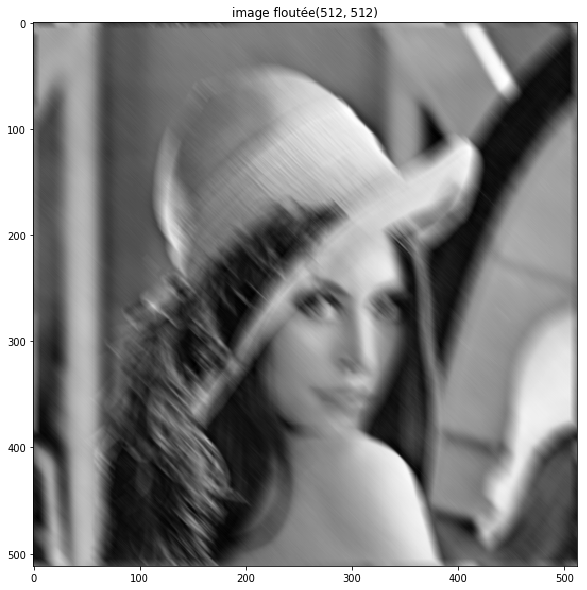

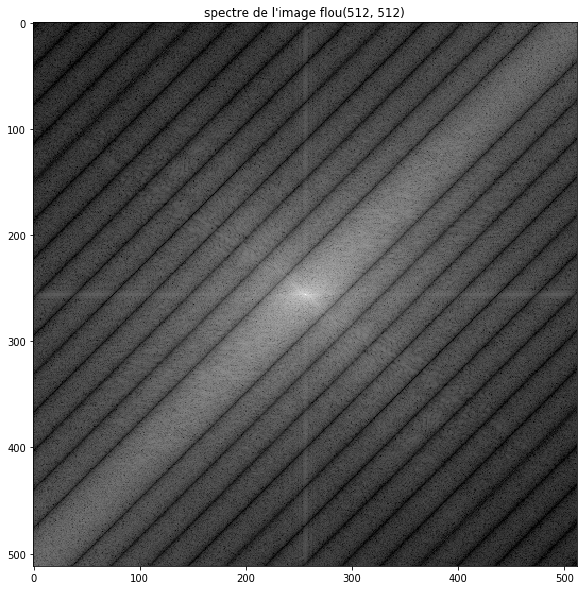

In [5]:
img = cv2.imread("lena.png",0) 

plot(img,"image de base")
plot_spectre(img, "spectre de l'image")

plot(20*np.log(np.abs(H(img,v,t,o)+1e-8)),"spectre du filtre")
img_flou=img_flou_bouge(img,v,t,o)
plot(img_flou,"image floutée")

spectre_img_flou=spectre_flou_bouge(img,v,t,o)
plot(spectre_img_flou, "spectre de l'image flou")

2) Proposer et programmer une méthode simple pour éliminer le flou de bougé
connu (tous les paramètres du flou sont connus).

In [6]:
def filtre_inverse(img,v,t,o):
    fft_img_flou=np.fft.fft2(img)
    fft_img_flou1=np.fft.fftshift(fft_img_flou)
    fft_corr_flou=H(img,v,t,o)
    fft_img=fft_img_flou1/fft_corr_flou
    return fft_img

def img_deflou_filtre_inv(img,v,t,o):
    fft_img=filtre_inverse(img,v,t,o)
    img=np.fft.ifft2(fft_img)
    return np.abs(img)
    
def spectre_deflou_filtre_inv(img,v,t,o):
    fft_img=filtre_inverse(img,v,t,o)
    fft_img_db = 20*np.log(np.abs(fft_img)+ 1e-8)
    return fft_img_db

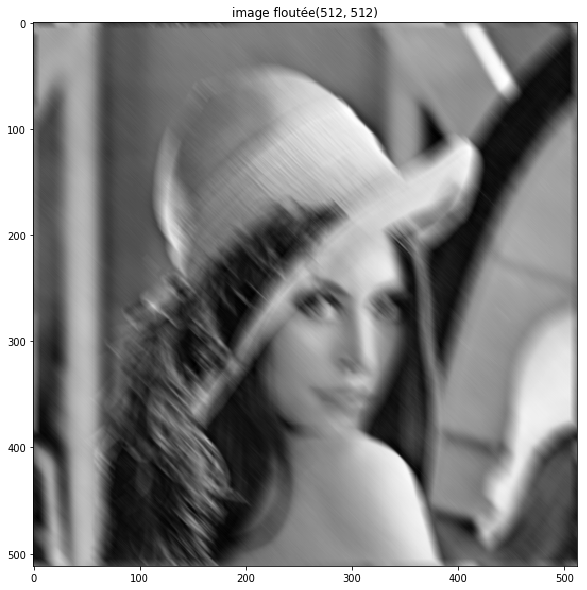

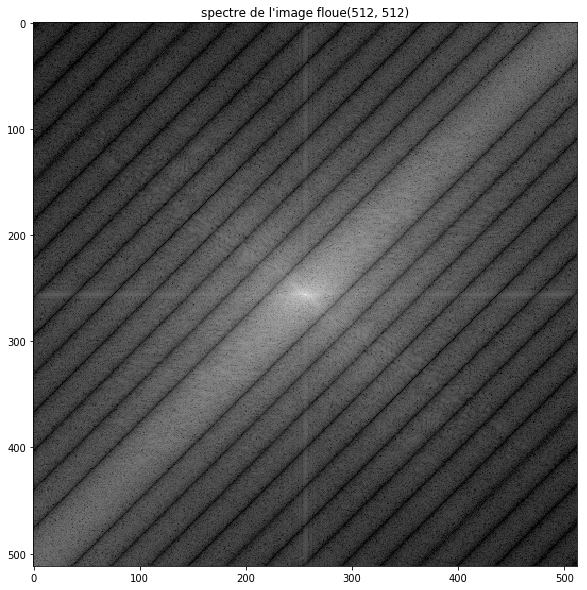

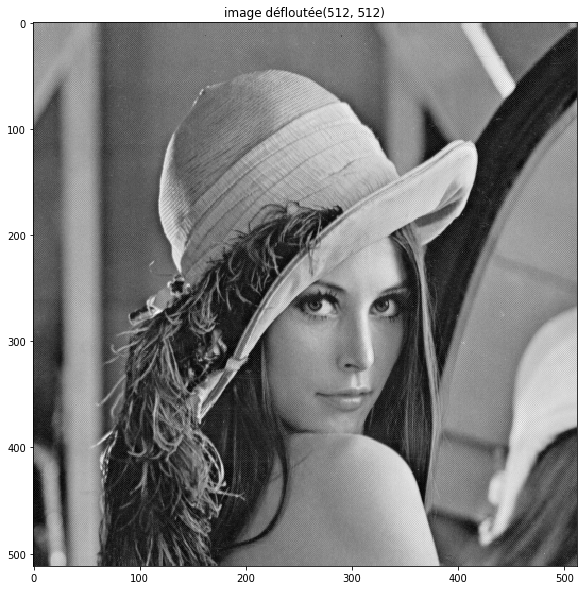

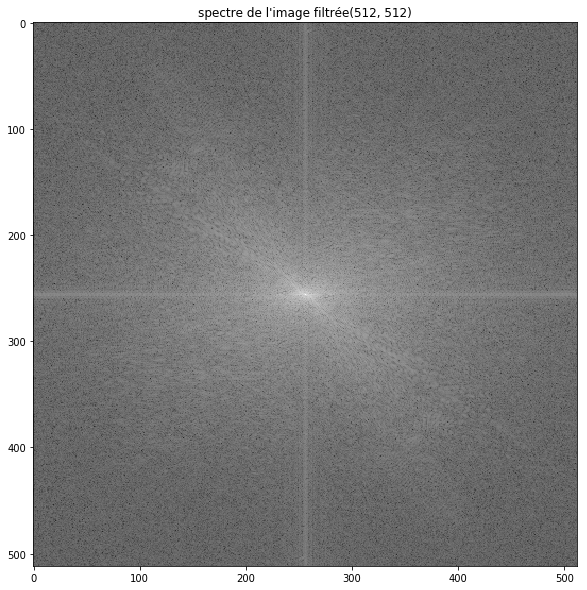

In [7]:
img_flou_bouge=img_flou_bouge(img,v,t,o)
plot(img_flou_bouge,"image floutée")
plot_spectre(img_flou_bouge, "spectre de l'image floue")

img_deflou=img_deflou_filtre_inv(img_flou_bouge,v,t,o)
plot(img_deflou, "image défloutée")
plot_spectre(img_deflou, "spectre de l'image filtrée")

3)Cette méthode fonctionne-t-elle toujours efficacement? Évaluer l'efficacité de la méthode proposée en fonction des paramètres du flou.

Notre programme n'est pas en accord avec les résultats attendus. En effet, il semblerai que pour chaque pôles du filtre inverse, la réstauration de l'image allait être dégradé. Or ici, nous observons une réstauration convenable de l'image. 

Il faut s'abstenir d'utiliser ce genre de filtrage inverse pour les flous, pour éviter ces passages en zero.

4)Ajouter un bruit blanc à l'image avec le flou (typiquement un bruit Gaussien
de moyenne nulle et de variance connue). La méthode proposée est-elle
robuste au bruit ?


In [8]:
def bruit_gauss (img, var):
    b=np.random.normal(0,var**0.5, img.shape)
    img_bruit=img+b
    return b, img_bruit

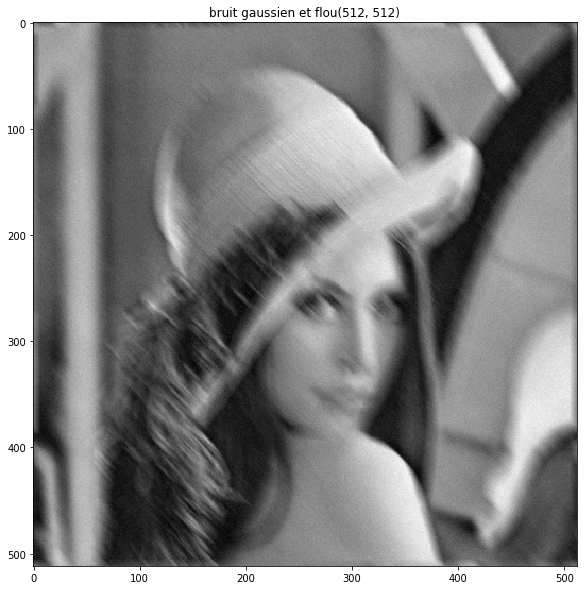

In [9]:
bruit,img_bruit_gauss=bruit_gauss(img_flou_bouge,var)
plot(img_bruit_gauss,"bruit gaussien et flou")

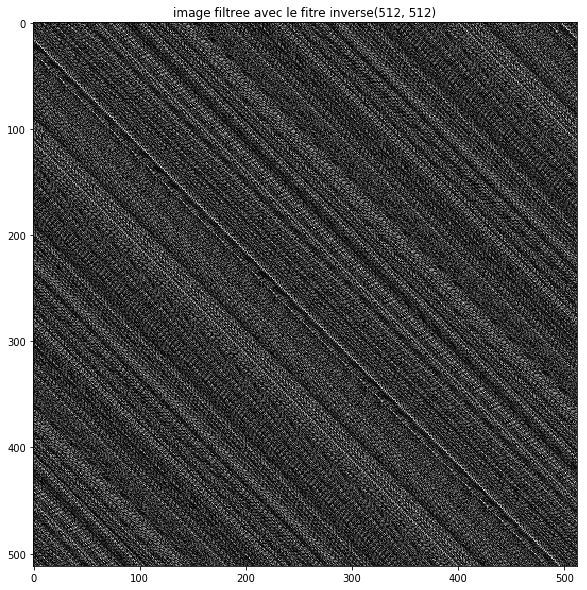

In [10]:
img_deflou_gauss=img_deflou_filtre_inv(img_bruit_gauss,v,t,o)
plot(img_deflou_gauss,"image filtree avec le fitre inverse")

On remarque que le fitrage inverse n'est pas robuste du tout face au bruit gaussien. Cela vient du fait qu'en prenant l'inverse du fitre de bougé, certaines valeurs du filtre deviennent très grande. 

On peut utiliser le filtrage pseudo-inverse pour limiter ces dépassements.

5)Proposer une amélioration pour prendre en compte la présence du bruit.

#### filtrage pseudo-inverse:

In [11]:
def filtre_pseudo_inv (img,v,t,o,S=3):
    fft_img_flou=np.fft.fft2(img)
    fft_img_flou1=np.fft.fftshift(fft_img_flou)
    fft_corr_flou=H(img,v,t,o)
    G=1/fft_corr_flou
    G[G<-S]=-S
    G[G>S]=S
    fft_img=fft_img_flou1*G
    return fft_img

def img_deflou_filtre_pseudo_inv(img,v,t,o,S=3):
    fft_img=filtre_pseudo_inv(img,v,t,o,S)
    img=np.fft.ifft2(fft_img)
    return np.abs(img)
    
def spectre_deflou_filtre_pseudo_inv(img,v,t,o,S=3):
    fft_img=filtre_pseudo_inv(img,v,t,o,S)
    fft_img_db = 20*np.log(np.abs(fft_img)+ 1e-8)
    return fft_img_db

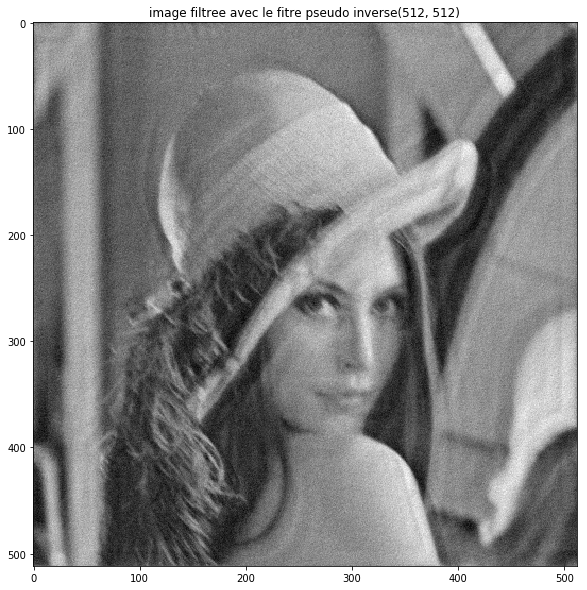

In [12]:
img_deflou_gauss=img_deflou_filtre_pseudo_inv(img_bruit_gauss,v,t,o)
plot(img_deflou_gauss,"image filtree avec le fitre pseudo inverse")

En testant plusieurs valeurs de S, on en trouve une satisfaisante. Mais l'image reste 'granuleuse', le résultat n'est donc pas optimal. De plus, pour chaque valeur du flou, il faut adapter la valeur de S.

On va utiliser le filtre de Wiener qui, normalement, est plus efficace.

#### filtre de wiener

In [13]:
def filtre_wiener (img_b,img,H,bruit):
    fft_img_flou=spectre(img_b)
    fft_img=spectre(img)
    r=np.abs(bruit)**2/np.abs(fft_img)**2
    G=(np.conjugate(H)/(np.abs(H**2)+r))
    new_fft_img=fft_img_flou*G
    return new_fft_img

def img_deflou_filtre_wiener(img_b,img,H,bruit):
    fft_img=filtre_wiener(img_b,img,H,spectre(bruit))
    new_img=np.fft.ifft2(fft_img)
    return np.abs(new_img)
    
def spectre_deflou_filtre_wiener(img_b,img,H,bruit):
    fft_img=filtre_wiener(img_b,img,H,spectre(bruit))
    fft_img_db = 20*np.log(np.abs(fft_img)+ 1e-8)
    return fft_img_db

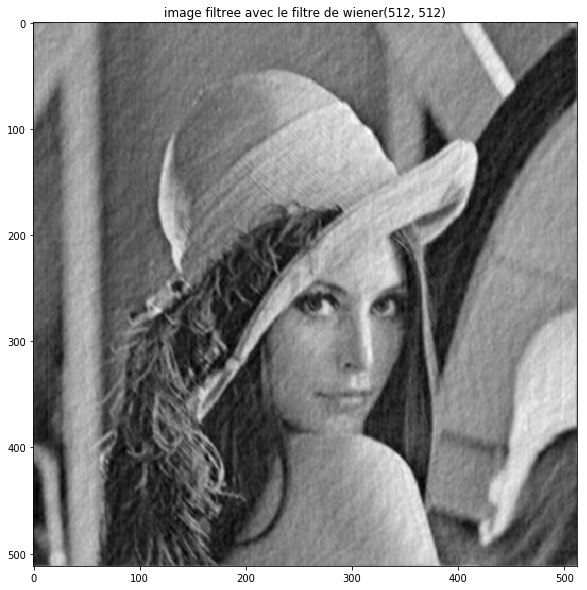

In [14]:
img_deflou_wiener=img_deflou_filtre_wiener(img_bruit_gauss,img,H(img,v,t,o),bruit)
plot(img_deflou_wiener,"image filtree avec le filtre de wiener")

Le resultat est meilleur que précédemment, mais l'image présente toujours quelque artefacts. 

6) En vous appuyant sur un formalisme mathématique soigné (et sur un
exercice de la séance 1), proposer une méthode simple pour estimer la
longueur L du bougé lorsque l'image avant le flou de bougé est inconnue. Les
autres paramètres du flou de bougé sont supposés connus.

7) Programmer la méthode d'estimation de la longueur L du flou de bougé.
Évaluer l'efficacité de cette méthode d'estimation (présence de bruit, valeur de
L, etc.).

In [15]:
def cepstre (img):
    fft_img=np.fft.fft2(img)
    c=np.fft.ifft2(np.log(np.abs(fft_img)**2))
    c=np.real(np.fft.fftshift(c))
    return c

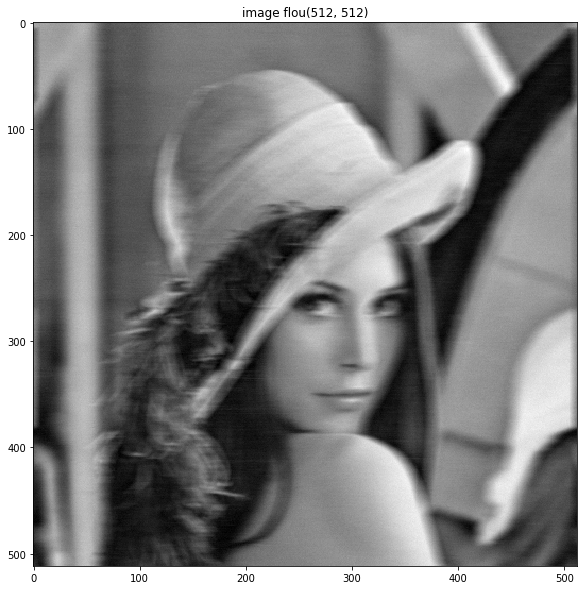

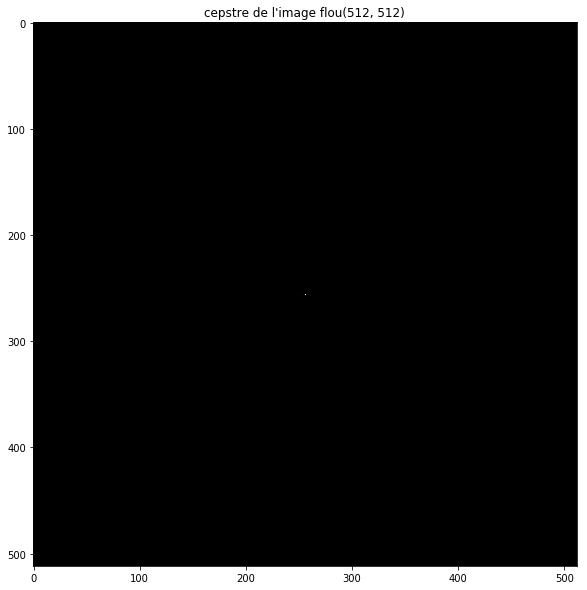

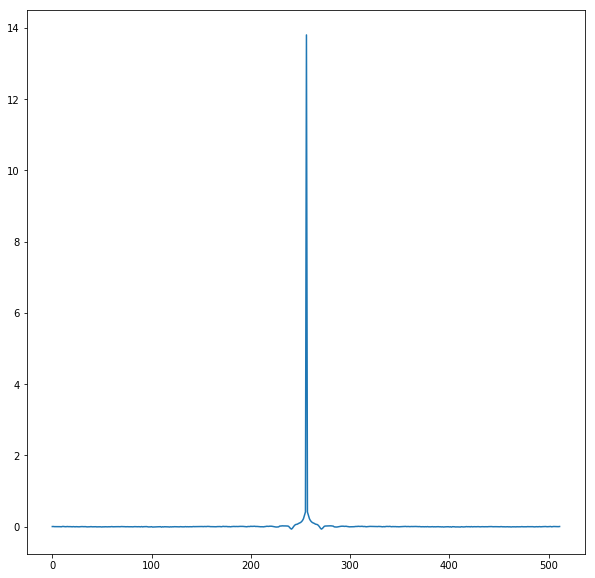

In [16]:
img_cepstre=cv2.imread("LenaMotionBlur1.png",0) 
plot(img_cepstre,"image flou")
cepstre=cepstre(img_cepstre)
plot(cepstre,"cepstre de l'image flou")

cepstre=cepstre[256]
plt.figure(1,figsize=(10,10))
plt.subplot(111), plt.plot(cepstre)
plt.show()

In [17]:
sort_cepstre=np.argsort(cepstre)
L=256-sort_cepstre[0]

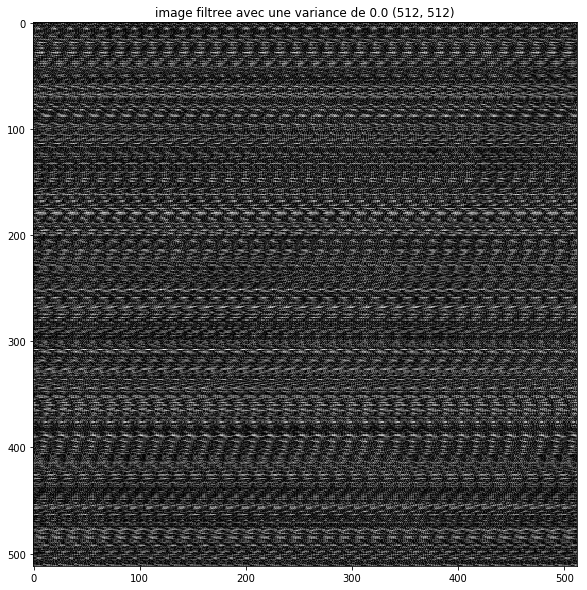

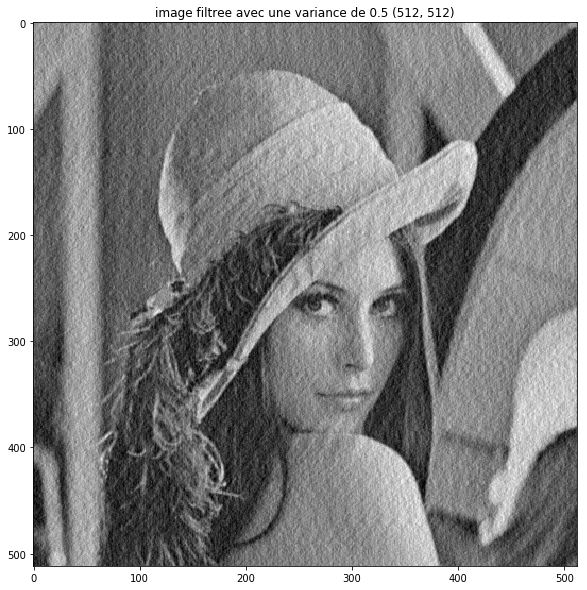

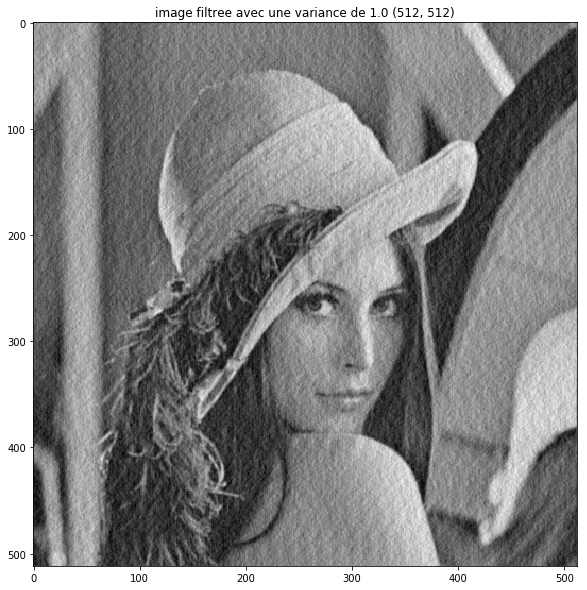

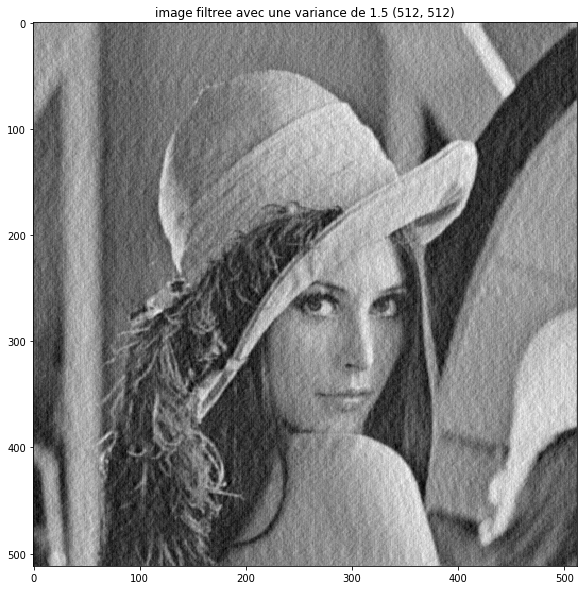

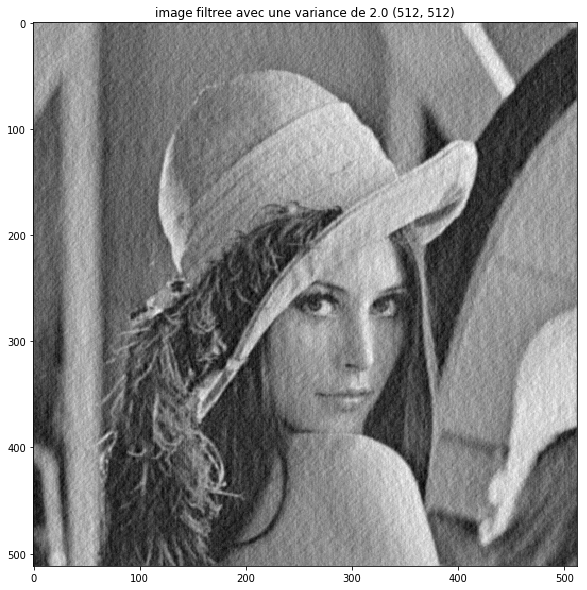

...

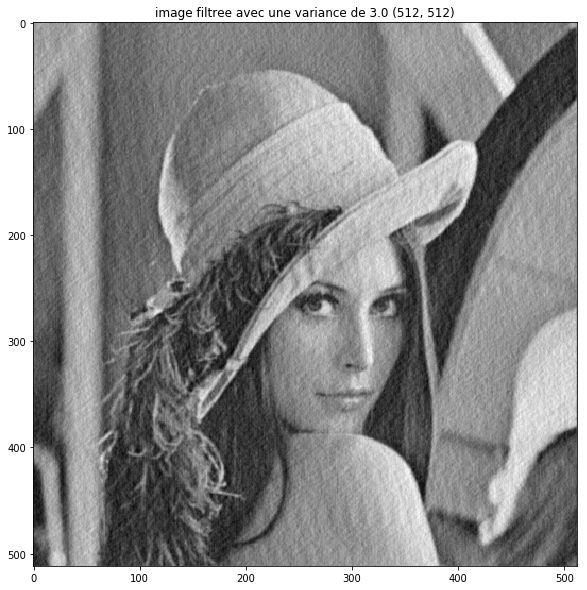

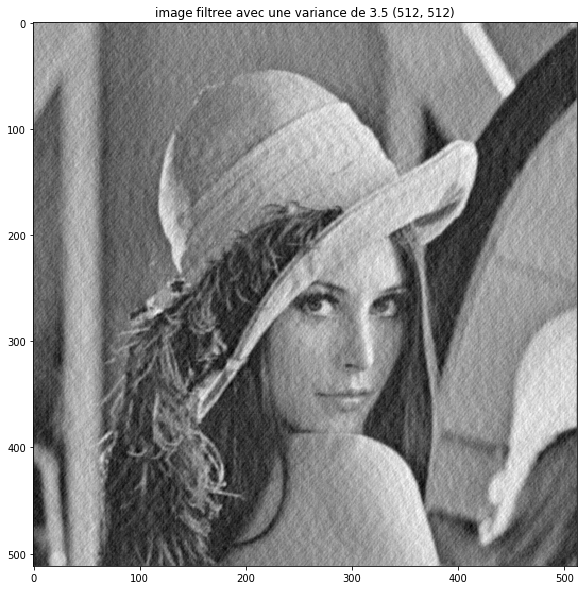

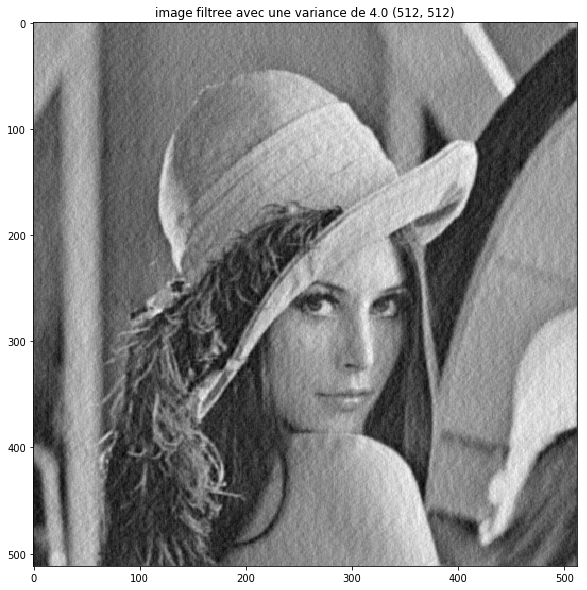

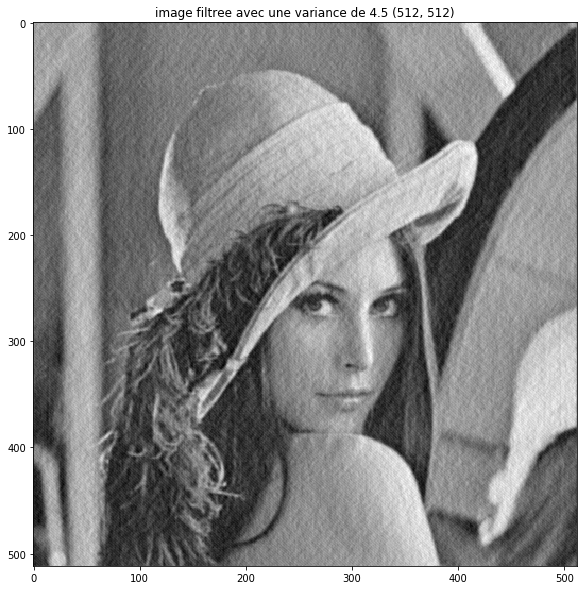

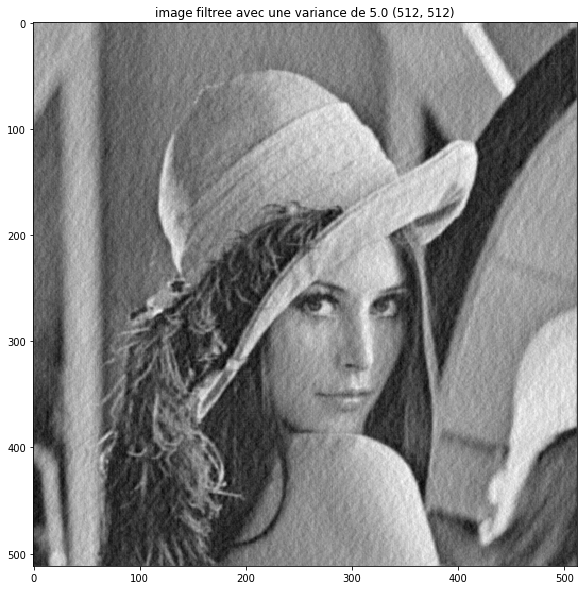

In [18]:
for i in np.arange(0,5.5,0.5):
    v=i
    b=np.random.normal(0,v**0.5, img_cepstre.shape)
    img_cepstre_deflou_wiener=img_deflou_filtre_wiener(img_cepstre,img,H(img_cepstre,L,1,0),b)
    plot(img_cepstre_deflou_wiener,"image filtree avec une variance de "+str(v)+" ")